<a href="https://colab.research.google.com/github/Tarinibo/Cognifyz-project-/blob/main/CognifyzLEVEL1_Task3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LEVEL 1: TASK 3

## Task: Geospatial Analysis
- Visualize the locations of restaurants on a map using latitude and longitude information.

- Analyze the distribution of restaurants across different cities or countries.

- Determine if there is any correlation between the restaurant's location and its rating.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns

In [4]:
df=pd.read_csv("/content/drive/Othercomputers/My Laptop/Desktop/Dataset.csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


### Visualize the locations of restaurants on a map using latitude and longitude information.

In [8]:
# Initialize the map centered at an average location
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)

# Add markers for each restaurant
for index, row in df.iterrows():
    # Skip rows with missing latitude, longitude, or rating
    if pd.isnull(row["Latitude"]) or pd.isnull(row["Longitude"]) or pd.isnull(row["Aggregate rating"]):
        continue

    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"{row['Restaurant Name']} - Rating: {row['Aggregate rating']}",
        icon=folium.Icon(color="blue" if row["Aggregate rating"] >= 4 else "red"),
    ).add_to(restaurant_map)

# Save map to an HTML file
restaurant_map.save("restaurants_map.html")
print("map saved successfully")


map saved successfully


In [9]:
restaurant_map

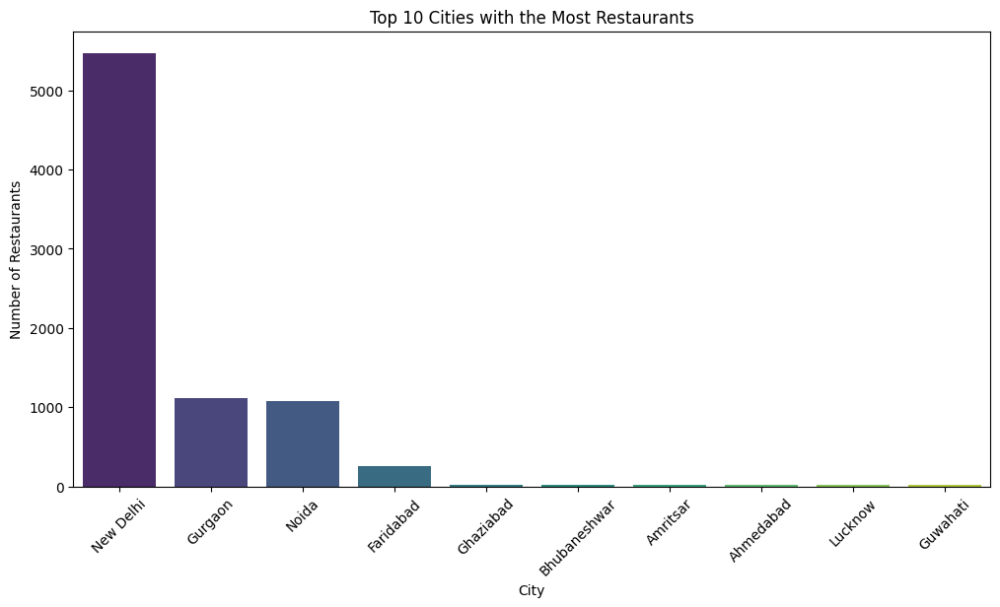

In [11]:
# Count of restaurants per city
top_cities = df["City"].value_counts().head(10)

plt.figure(figsize=(12, 6))
sns.barplot(
    x=top_cities.index,
    y=top_cities.values,
    hue=top_cities.index,
    palette="viridis")
legend=False

plt.xticks(rotation=45)
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Cities with the Most Restaurants")
plt.show()

### Analyze the distribution of restaurants across different cities or countries ###

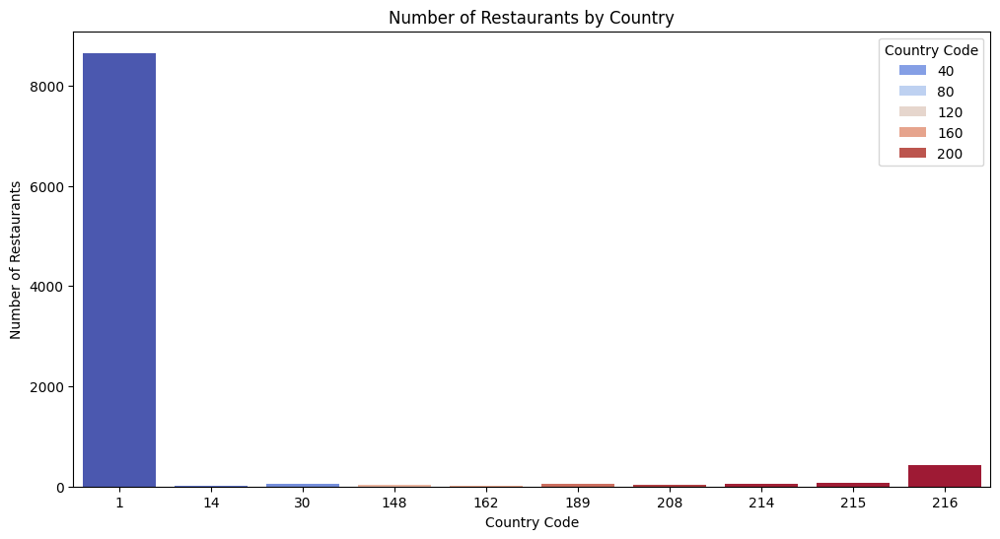

In [13]:
# Count of restaurants per country
top_countries = df["Country Code"].value_counts().head(10)

plt.figure(figsize=(12, 6))
sns.barplot(
            x=top_countries.index,
            y=top_countries.values,
            hue=top_countries.index,
            palette="coolwarm")
legend=False
plt.xlabel("Country Code")
plt.ylabel("Number of Restaurants")
plt.title("Number of Restaurants by Country")
plt.show()

### Determine if there is any correlation between the restaurant's location and its rating.

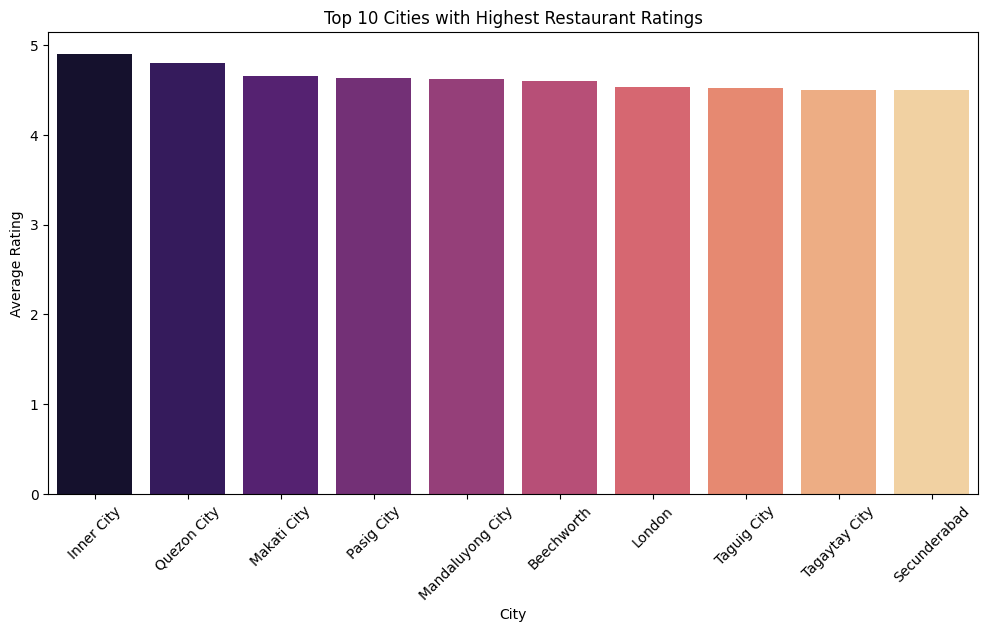

In [14]:
top_cities_rating = df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(
    x=top_cities_rating.index,
    y=top_cities_rating.values,
    hue=top_cities_rating.index,
    palette="magma")
legend=False
plt.xticks(rotation=45)
plt.xlabel("City")
plt.ylabel("Average Rating")
plt.title("Top 10 Cities with Highest Restaurant Ratings")
plt.show()

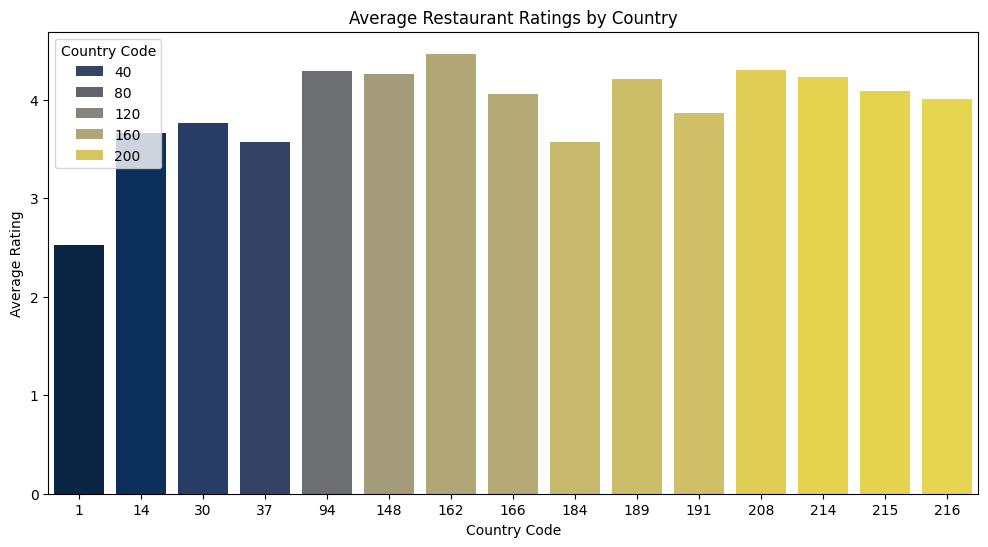

In [15]:
avg_rating_by_country = df.groupby("Country Code")["Aggregate rating"].mean()

plt.figure(figsize=(12, 6))
sns.barplot(x=avg_rating_by_country.index,
            y=avg_rating_by_country.values,
            hue=avg_rating_by_country.index,
            palette="cividis")
legend=False
plt.xlabel("Country Code")
plt.ylabel("Average Rating")
plt.title("Average Restaurant Ratings by Country")
plt.show()